Implementación de la Transformada de Fourier Fraccionaria utilizando la FFT

Introducción

La óptica de Fourier ha avanzado en los últimos años gracias a los últimos desarrollos en cuanto al formalismo e implementación óptica de la transformada de Fourier fraccionaria(FRT), dicho formalismo permite realizar las operaciones ópticas clásicas como lo son la convolución, correlación, difracción,etc. Pero de una manera más general. La representación de la difracción escalar mediante el uso de una transformada Fraccionaria permíte a parte de darle un toque de elegancia al modelo , la optimización del cálculo numérico de las distribuciones de difracción obtenidas, a partir del uso de la tranformada fraccionaria rápida(FFRT). El objetivo de este trabajo consiste en implementar tanto computacional como experimentalmente la difracción de Fresnel mediante el formalismo de la FRT y comparar los regímenes espaciales de aplicación óptimos, para cada de los modelos numéricos de difracción(clásicos y con la FRT). En este trabajo se muestra cómo expresar analíticamente la difracción de Fresnel mediante una FRT, se realiza la implementación computacional y la verificación experimental por medio de hologramas generados por computador, difractados ópticamente mediante el uso de un modulador espacial de luz (SLM). 

TRANSFORMADA DISCRETA DE FOURIER

La implementación óptica de la transformada de Fourier está dada por el siguiente esquema:
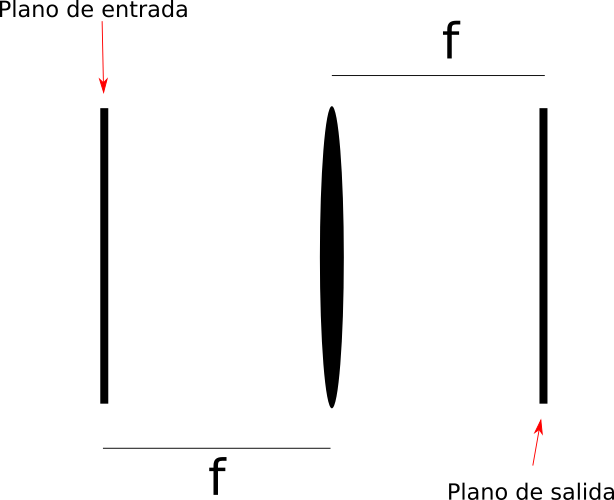
De esta forma se obtiene sobre el plano de salida una transformada de Fourier escalada de la transparencia de entrada $u(x)$ así:
\begin{equation}
\widetilde{u}(\widetilde{x})= \frac{\exp{(jkf)}}{j\lambda f}\int_{-\infty}^{\infty}  u(x)\exp{\left(-j\frac{2\pi}{\lambda f}x\widetilde{x}\right)}dx
\end{equation}
Recordar que $k=\frac{2\pi}{\lambda}$, el factor $\lambda f$ es el factor de escala entre la transformada de Fourier y la distribución de luz obtenida(difracción de campo lejano). 

Para realizar la implementación numérica de dicha transformada se deben discretizar los planos de entrada y salida respectivamente:
\begin{equation}
x=m\Delta x
\end{equation}

\begin{equation}
\widetilde{x}=\widetilde{m}\Delta \widetilde{x}
\end{equation}
Con $m$ y $\widetilde{m}$ enteros. Con un apropiado intervalo de muestreo, se evita la perdida de información y se minimiza el número de operaciones a realizar (teoría de muestreo).

Despues de realizar el muestreo, se obtiene una distribución así (DFT):
\begin{equation}
\widetilde{u}_{\widetilde{x}} = \sum_{m=-N/2}^{N/2-1}u_{m}\exp{\left(-j\frac{2\pi}{N}m\widetilde{m}\right)}
\end{equation}
$N$ es la dimensión de los vectores del plano de entrada y el plano de salida. Esto es gracias a asumir que:
\begin{equation}
\lambda f = N \Delta x \Delta \widetilde{x}
\end{equation}
para poder realizar el cálculo por medio de la transformada discreta de Fourier.
Naturalmente debe cumplirse que para los planos de entrada y salida respectivamente, la longitud real sea:
\begin{equation}
L_{x}= N\Delta x, ~L_{\widetilde{x}}= N\Delta \widetilde{x}
\end{equation}

La difracción de Fresnel (campo medio a campo lejano) se puede puede hallar en términos de la $DFT$ y consecuentemente con la $FFT$, esto acelera considerablemente los cálculos. Sin embargo, debido al factor de escala en la transformada Discreta, no se puede establecer una única función para el cálculo de la difracción del plano contiguo al objeto hasta cualquier distancia (infinita en general); así pues es necesario separar las regiones para el cálculo (campo medio-lejano y campo cercano-medio) y establecer cuales serán las funciones de propagación son óptimas para cada región.

${Caso~A.~Campo~medio~hasta~el~campo~de~Fourier}:$ 
Por cualquiera de los métodos para solucionar el problema de difracción-propagación, se obtiene que la distribución del campo difractado a una distancia $z$ de una transparencia $u(x)$ por la incidencia de una onda plana es:
\begin{equation}
u'(x') = \frac{\exp{(jkz)}}{j\lambda z}\left[u(x)*\exp{\left( j\frac{\pi}{\lambda z}x'^{2}\right)}\right]
\end{equation}
El símbolo $*$ denota la operación convolución. Haciendo uso de la propiedad de convolución espacial de la FT (transformada de Fourier) se obtiene que la expresión anterior se puede expresar en forma integral así:
\begin{equation}
\begin{split}
u'(x')= \frac{\exp{(jkz)}}{j\lambda z}\exp{\left(j\frac{\pi}{\lambda z}x'^{2}\right)}\\
\times\int_{-\infty}^{\infty}  \left[u(x)\exp{\left(j\frac{\pi}{\lambda z}x^{2}\right)}\right]\exp{\left(-j\frac{2\pi}{\lambda z}xx'\right)}dx
\end{split}
\end{equation}
Se aprecia entonces que esta expresión está dada por una transformada de Fourier escalada de la transparencia en el plano de entrada multiplicada por un factor de fase, posterior a esto,  se multiplica dicho resultado por un factor de fase cuadrático.

Recordar que para poder llevar acabo el cálculo de la difracción de Fresnel usando la $FFT$ se necesita que se cumpla:
\begin{equation}
N\Delta x \Delta x' = \lambda z
\end{equation}
Y ya que $L_{x}= N\Delta x$ y $L_{x'}= N\Delta x'$  , tambien se cumple que:
\begin{equation}
L_{x}L_{x'}= \lambda z N
\end{equation}
Realizando las respectivas sustituciones en la expresión contínua de la difracción de Fresnel se obtiene:
\begin{equation}
\begin{split}
u'_{m'}= \frac{\exp{(jkz)}}{j\lambda z}exp{\left(j\frac{\pi \lambda z}{L_{x}^{2}}m'^{2}\right)}\\
\times \sum_{m=-N/2}^{N/2-1}\left[u_{m}exp{\left(\frac{j\pi L_{x}^{2}m^{2}}{\lambda z N^{2}}\right)}\right]\exp{\left(-j\frac{2\pi}{N}mm'\right)}
\end{split}
\end{equation}


Con esto se garantiza que la difracción de Fresnel sea calculada por medio de la $FFT$. Haciendo un análisis a la restricción $L_{x}L_{x'}= \lambda z N$, se puede ver que para valores grandes de $z$, se debe tener un mayor valor de $L_{x'}$ para que se satisfaga la condición. Algo importante a considerar en la implementación computacional es que el factor de fase constante $\frac{\exp{(jkz)}}{j\lambda z}$ debe estar normalizado, de otra forma, se obtienen resultados que no son triviales de interpretar.

Desafortunadamente este método de estar ajustando el valor de $L_{x'}$ para cualquier $z$ no funciona en cualquier región, debido a que la función de fase cuadrática acompañando la distribución de entrada, tiene que a valores pequeños de $z$ esta varía extremadamente rápido (ver figura acontinuación), por lo que no se puede realizar un muestreo idóneo.

Delta x = 0.0050000000 [m]


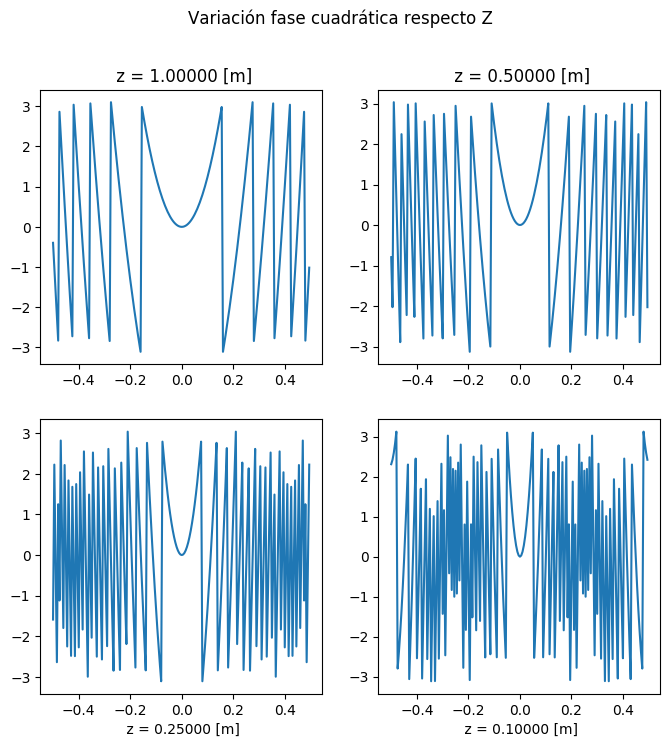

In [14]:
import numpy as np
import matplotlib.pyplot as plt
Lx = 1 # dimensión del plano entrada
l_onda = 633e-9 #longitud de onda
N = 200 # número de muestras
Delta_x = Lx/(N) # tamaño del paso
m = np.arange(-Lx/2, (Lx/2), Delta_x) # vector en el plano de entrada
print('Delta x = %.10f [m]'% Delta_x)
plt.figure(num=1, figsize = (8,8), dpi= 100)
plt.suptitle('Variación fase cuadrática respecto Z')
plt.subplot(2,2,1)
z = 1 # distancia de calculo de la propagación
f_cuadratica = np.exp(1j*np.pi*(Lx**2)*(m**2)/(l_onda*z*(N**2))) # función chirp
plt.plot(m,np.angle(f_cuadratica))
plt.title(' z = %.5f [m]'%z)
plt.subplot(2,2,2)
z = 0.5 # distancia de calculo de la propagación
f_cuadratica = np.exp(1j*np.pi*(Lx**2)*(m**2)/(l_onda*z*(N**2))) # función chirp
plt.plot(m,np.angle(f_cuadratica))
plt.title(' z = %.5f [m]'%z)
plt.subplot(2,2,3)
z = 0.25 # distancia de calculo de la propagación
f_cuadratica = np.exp(1j*np.pi*(Lx**2)*(m**2)/(l_onda*z*(N**2))) # función chirp
plt.plot(m,np.angle(f_cuadratica))
plt.xlabel(' z = %.5f [m]'%z)
plt.subplot(2,2,4)
z = 0.1 # distancia de calculo de la propagación
f_cuadratica = np.exp(1j*np.pi*(Lx**2)*(m**2)/(l_onda*z*(N**2))) # función chirp
plt.plot(m,np.angle(f_cuadratica))
plt.xlabel(' z = %.5f [m]'%z)
plt.show()

Para determinar el rango de un muestréo idoneo, primero notar que el factor de fase:
\begin{equation}
exp{\left(\frac{j\pi L_{x}^{2}m^{2}}{\lambda z N^{2}}\right)}
\end{equation}
varía linealmente con la distancia  desde el centro del vector $m$ como se vé en la figura acontinuación:
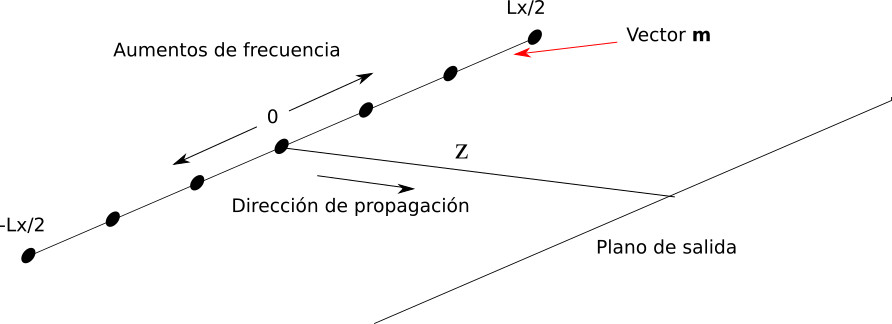



Si se asume que en la frontera del dominio de la función de fase cuadrática el periodo de la función es menor al periodo de muestreo, se obtiene el siguiente criterio(de acuerdo con Nyquist):
\begin{equation}
z\geq z_{1}\equiv \frac{L_{x}^{2}}{\lambda N}
\end{equation}

Asumir esta condición se puede soportar por medio del uso de imágenes con una $envolvente$ de ceros en sus extremos, por lo que las frecuencias altas submuestreadas de la función de fase cuadrática no afectarán la transparencia en el plano de entrada. Aparte de esto, agregar estos ceros en las fronteras de la imagen puede suponer una mejora en el muestreo de la zona interior de interes. Otra consecuencia interesante de rellenar con ceros los extremos, es que al utilizar el algoritmo FFT al calcular la difracción, si el espectro obtenido se sale de los límites del contorno de la imagen, estos aparecen del lado inverso y se superponen con la información de dicho lado, esto genera pérdida de información y errores, distorsión que se evita con los ceros de la envolvente.

$Caso ~B.Campo ~cercano ~ al  ~objeto ~ hasta ~ el ~ campo ~ medio$

En este caso, el cálculo del campo propagado no se puede realizar por medio del uso de la convolución antes descrita, debido a los impedimentos de las altas frecuencias de la función de fase cuadrática para $z\leq z_{1}$. Debido a este impedimento, se hace mas conveniente propagar la transformada de Fourier de la señal, que la señal misma.

Entonces, de la expresión de la convolución espacial, se transforma a una multiplicación en el dominio frecuencial (por propiedad de la transformada) así:
\begin{equation}
\widetilde{U}'(\nu)= \frac{\exp{(jkz)}}{j\lambda z}\widetilde{u}(\nu)\exp{(-j\pi\lambda z\nu^{2})}
\end{equation}
Donde $\widetilde{u}(\nu)$  y $\exp{(-j\pi\lambda z\nu^{2})}$  corresponden a las transformadas de Fourier de las funciones $u(x)$ y $\exp{\left( j\frac{\pi}{\lambda z}x'^{2}\right)}$ respectivamente.

Se discretiza la variable frecuencial $\nu$ en la exponencial en el plano de Fourier $\nu = \widetilde{m}\Delta \widetilde{\nu}$, y utilizando la relación de las coordenadas espaciales y frecuenciales($\Delta \nu = \frac{1}{L_{x}}$), se tiene que:
\begin{equation}
\exp{(-j\pi\lambda z\nu^{2})}=\exp{(-j\pi\lambda z(\widetilde{m}\Delta \widetilde{\nu})^{2})} = \exp{\left(-j\pi\frac{ \lambda z}{L_{x}^{2}}\widetilde{m}^{2}\right)} 
\end{equation}

Con este desarrollo, se puede observar en la ecuación anterior, que para valores de $z$ pequeños, la frecuencia de la función de fase cuadrática se hace pequeña, todo lo contrario al caso anterior de propagación del campo medio al campo de Fourier. Entonces se concluye que esta función permite calcular algún patrón de difracción a distancias relativamente cortas (donde la aproximación de Fresnel aún siga siendo valida). El método consiste entonces en calcular la transformada de Fourier ($FT$) de la transparencia de entrada $u(x)$, multiplicarla por el factor de fase anterior, y por último realizar una transformada inversa de Fourier($IFT$)  del resultado obteniendo así el campo propagado hasta $z\leq z_{1}$. La mayor diferencia entre este método y el anterior es el doble uso de una transformada de Fourier, una inversa y otra directa. 

A la función de propagación para $z>z_{1}$ se le denominará propagador respuesta al impulso y a la función de propagación para $z<z_{1}$ se le llamará propagador función de transferencia. A continuación se realiza la implementación de los dos propagadores aplicando los criterios establecidos.

Ya que el desarrollo es para observar patrónes de difracción, todo lo anterior tiene su equivalente bidimensional debido a que todas las variables son separables, basta con agregar la segunda dimensión, entonces, ya que se cuentan con parámetros bien definidos de la instrumentación óptica el desarrollo del proyecto seguirá ligado a estos:

\begin{equation}
\begin{split}
&M = 1024,~Numero~de~pixeles~horizontales~del~modulador~SLM\\
&N = 768,~Numero~de~pixeles~verticales~del~modulador~SLM\\
&\delta x = 19\mu m,~tamaño~del~pixel\\
&\lambda = 633nm,~longitud~de~onda~de~la~fuente~coherente~a~usar
\end{split}
\end{equation}

Las dimensiones del modulador son:
\begin{equation}
\begin{split}
&L_{x} = M \delta x=20.07mm,~Longitud~horizontal~del~SLM\\
&L_{y} = N\delta x=15.05mm,~Longitud~vertical~del~SLM\\
\end{split}
\end{equation}

Se trabajará con un $N = 768$ inicialmente, esto es, matrices cuadradas para observar los fenómenos de perturbación de la imagen debido a los análisis anteriores. En la clase propagadores se encuentran los códigos para las respectivas funciones de propagación definidas para los dos casos anteriores.

La distancia crítica sera:

In [2]:
N = 768 # número de pixeles verticales del SLM
dx = 19e-6 # tamaño del pixel
l_onda = 633e-9 #longitud de onda
Ly = N*dx #longitud vertical del SLM
z_min_x = (Ly**2)/(l_onda*N) # distancia crítica en z respecto a x 
print('Z crítico  = ',z_min_x,'[m]')

Z crítico  =  0.43799052132701427 [m]


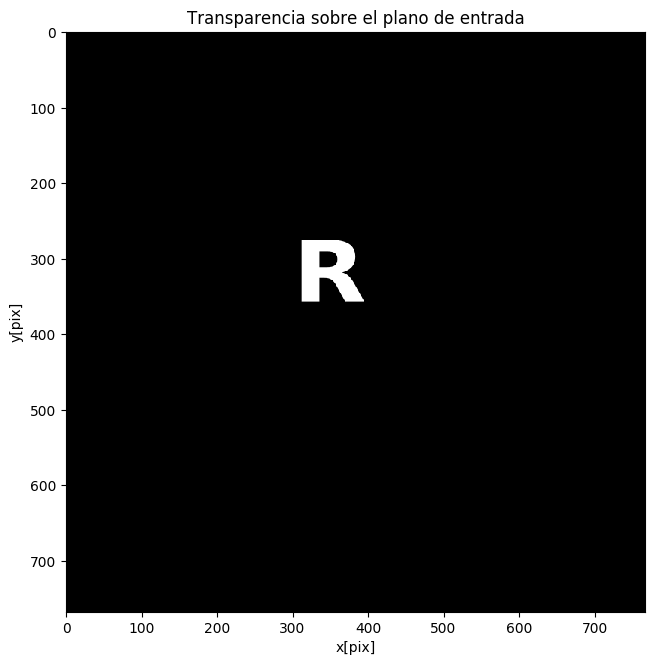

In [3]:
func = plt.imread('difraccion_imagen.png') # transparencia de entrada
func = func[:,:,0] # selección del canal
plt.figure(num = 2, figsize = (7.68,7.68), dpi = 100)
plt.imshow(np.log(func+100),cmap = 'gist_gray') 
plt.title('Transparencia sobre el plano de entrada')
plt.xlabel('x[pix]')
plt.ylabel('y[pix]')
plt.show()

En la clase propagadores, se encuentran los dos propagadores (respuesta al impulso y función de transferencia), en la figura a continuación se evidencia que para distancias mayores a la distancia crítica, el $campo$ propagado por el propagador con función de transferencia muestra signos de perturbación debido a la violación de las condiciones de muestreo, esto como consecuencia de las frecuencias altas de la función de fase cuadrática mencionada antes. Por otro lado, cuando se encuentra por debajo de la distancia crítica no se observan las perturbaciones en la intensidad del campo como era de esperarse.

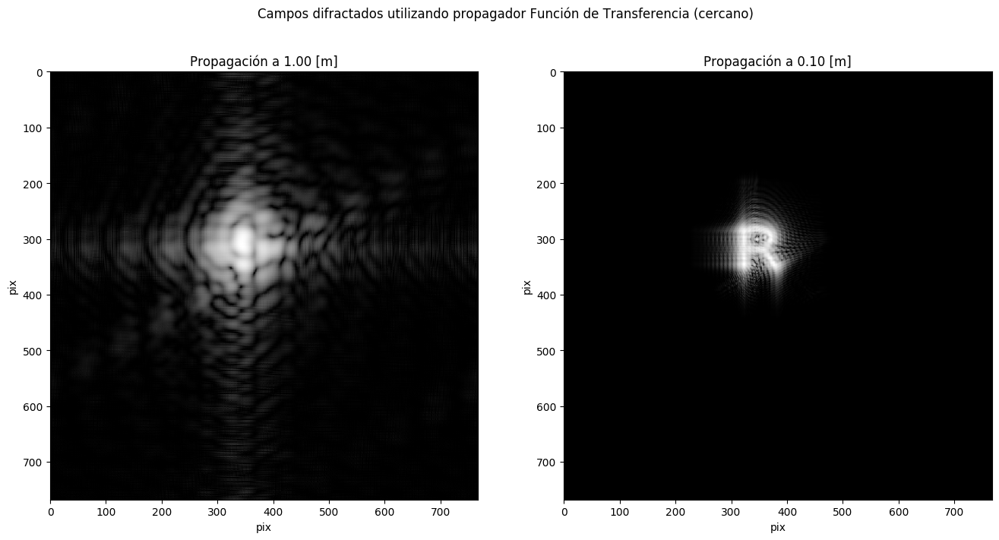

In [4]:
from propagadores import *  # clase propagadores
propagador_seleccion = propagador2d_cuadrados() #propagadores 2d cuadrados
z = 1 # distancia de propagación 1 del campo 
campo_1_z_1 = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z) # propagador función de transferencia
plt.figure(num = 2, figsize = (16,7.68), dpi = 100)
plt.suptitle('Campos difractados utilizando propagador Función de Transferencia (cercano)')
plt.subplot(1,2,1)
plt.title('Propagación a %.2f [m]'%z)
campo_1_z_1=abs(campo_1_z_1)**2 # intensidad del campo sobre z_1 1m
campo_1_z_1 = campo_1_z_1/np.amax(campo_1_z_1)
plt.imshow(np.log(campo_1_z_1+.001),cmap = 'gist_gray')
plt.xlabel('pix')
plt.ylabel('pix')
plt.subplot(1,2,2)
z = 0.1 # distancia de propagación 2 del campo 
campo_1_z_2 = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z)
plt.title('Propagación a %.2f [m]'%z)
campo_1_z_2=abs(campo_1_z_2)**2 # intensidad del campo sobre z_2 0.1m
campo_1_z_2 = campo_1_z_2/np.amax(campo_1_z_2)
copia_campo = campo_1_z_2
plt.imshow(np.log(campo_1_z_2+.001),cmap = 'gist_gray')
plt.xlabel('pix')
plt.ylabel('pix')
plt.show()

A continuación se realiza el cálculo de los campos difractados por medio del uso del propagador respuesta al impulso.

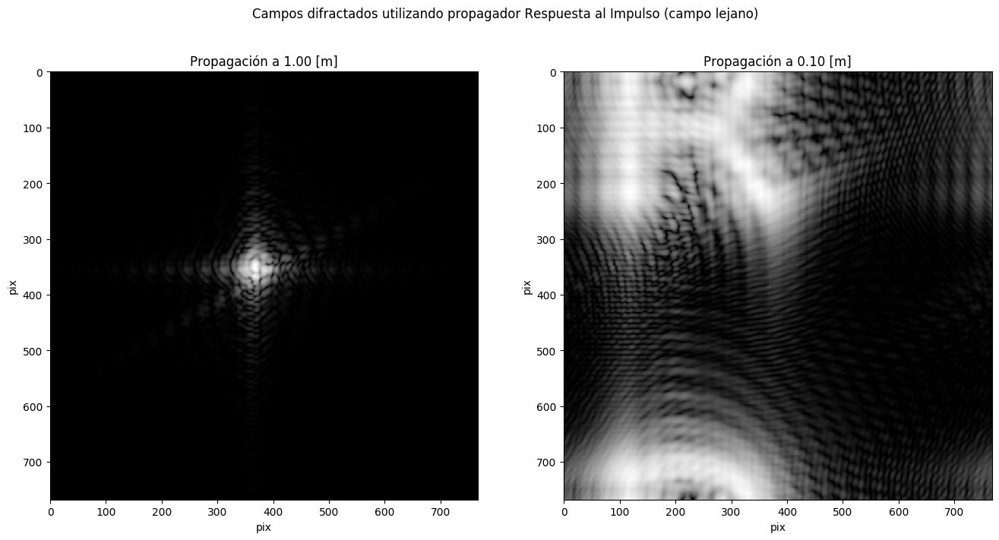

In [5]:
z = 1 # distancia de propagación 1 del campo 
campo_1_z_1 = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)# propagador respuesta al impulso
plt.figure(num = 2, figsize = (16,7.68), dpi = 100)
plt.suptitle('Campos difractados utilizando propagador Respuesta al Impulso (campo lejano)')
plt.title('Propagación a %.2f [m], propagador Función de Transferencia'%z)
plt.subplot(1,2,1)
plt.title('Propagación a %.2f [m]'%z)
campo_1_z_1=abs(campo_1_z_1)**2 # intensidad del campo sobre z_1 1m
campo_1_z_1 = campo_1_z_1/np.amax(campo_1_z_1)
plt.imshow(np.log(campo_1_z_1+.001),cmap = 'gist_gray')
plt.xlabel('pix')
plt.ylabel('pix')
plt.subplot(1,2,2)
z = 0.1 # distancia de propagación 2 del campo 
campo_1_z_2 = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)
plt.title('Propagación a %.2f [m]'%z)
campo_1_z_2=abs(campo_1_z_2)**2 # intensidad del campo sobre z_2 0.1m
campo_1_z_2 = campo_1_z_2/np.amax(campo_1_z_2)
plt.imshow(np.log(campo_1_z_2+.001),cmap = 'gist_gray')
plt.xlabel('pix')
plt.ylabel('pix')
plt.show()

Se evidencia que el campo para distancias menores que la distancia $z$ crítica, presenta superposición de componentes espaciales de difracción debido a la variación de escala (esto debido a la condición $L_{x}L_{x'}= \lambda z N$), por lo tanto no es posible trabajar con dicha función a distancias menores a la crítica como era de esperarse. Recordar que justo despues de la transparencia, el patrón de difracción es muy semejante al objeto mismo sobre la transparencia además de algunas componentes de difracción de bordes (pero se sale de la aproximación de Fresnel). Por otro lado, si se calcula el campo difractado a una distancia $z$ relativamente grande, se espera obtener el patrón de difracción de Fraunhofer (transformada de Fourier escalada), por lo que para una $z$ grande, el propagador Respuesta al Impulso, debería brindar el patrón de intensidad correspondiente al patrón de intensidad de Fraunhofer. Acontinuación se procede a verificar esto último.

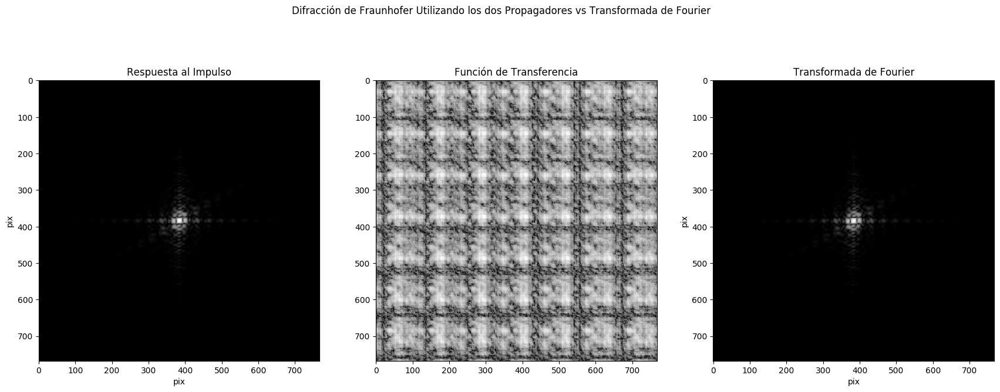

In [6]:
z = 50 # distancia de propagación 1 del campo 
campo_1_z_1 = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)
plt.figure(num = 2, figsize = (21,7.68), dpi = 100)
plt.suptitle('Difracción de Fraunhofer Utilizando los dos Propagadores vs Transformada de Fourier')
plt.subplot(1,3,1)
plt.title('Respuesta al Impulso')
campo_1_z_1=abs(campo_1_z_1)**2 # intensidad del campo sobre z_1 0.8m
campo_1_z_1 = campo_1_z_1/np.amax(campo_1_z_1)
plt.imshow(np.log(campo_1_z_1+.001),cmap = 'gist_gray')
plt.xlabel('pix')
plt.ylabel('pix')
plt.subplot(1,3,2)
z = 50 # distancia de propagación 2 del campo 
campo_1_z_2 = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z)
plt.title('Función de Transferencia')
campo_1_z_2=abs(campo_1_z_2)**2 # intensidad del campo sobre z_2 0.3m
campo_1_z_2 = campo_1_z_2/np.amax(campo_1_z_2)
plt.imshow(np.log(campo_1_z_2+.001),cmap = 'gist_gray')
plt.subplot(1,3,3)
plt.title('Transformada de Fourier')
# difracción de Fraunhofer
campo_fraunhofer = np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(func))) # patrón de fraunhofer
plt.figure(num = 2, figsize = (7.68,7.68), dpi = 100)
campo_fraunhofer=abs(campo_fraunhofer)**2
campo_fraunhofer = campo_fraunhofer/np.amax(campo_fraunhofer)
plt.imshow(np.log(campo_fraunhofer+.001),cmap = 'gist_gray')
plt.xlabel('pix')
plt.ylabel('pix')
plt.show()

Como se observa, el propagador respuesta al impulso cumple con la condición que para $z$ suficientemente grandes brinda el patrón de difracción de campo lejano o difracción de Fraunhofer, mientras que la función de transferencia como era de esperarse colapsa.

$Transformada~de~Fourier~Fraccionaria$

Como ya se definió anteriormente, la expresión de la difracción de Fresnel producida por un objeto $u_{0}$(trnasparencia) a una distancia $z$ cuando esta es iluminada con una plana monocromática es:

\begin{equation}
\begin{split}
u_{z}(x_{z})=\exp{\left(\frac{i\pi x_{z}^{2}}{\lambda z}\right)}\int_{-\infty}^{\infty}u_{0}(x_{0})\exp{\left(\frac{i\pi x_{0}^{2}}{\lambda z}\right)}\exp{\left(-\frac{2i\pi x_{z}x_{0}}{\lambda z}\right)dx_{0}}
\end{split}
\end{equation}

Se define la transformada de Fourier fraccionaria de orden $0<|p|<1$, así:
\begin{equation}
\begin{split}
u^{p}(a')=C_{p}{\left[j\frac{\pi}{\tan{p(\pi/2)}}a'^{2}\right]}
\int_{-\infty}^{\infty}u(a)\exp{\left[-j\frac{\pi}{\tan{p(\pi/2)}}a^{2}\right]}\\
\times \exp{\left[-j\frac{2\pi}{\sin{p(\pi/2)}}aa'\right]da}
\end{split}
\end{equation}

Donde $C_{p}$ es un factor constante:
\begin{equation}
C_{p}=\frac{\exp{-j\pi sgn[p(\pi/2)]/4}+jp(\pi/4)}{|\sin{p(\pi/2)}|^{1/2}}
\end{equation}

Lohmann propone un montaje óptico como el que se observa acontinuación para determinar la transformada fraccionaria de Fourier óptica:

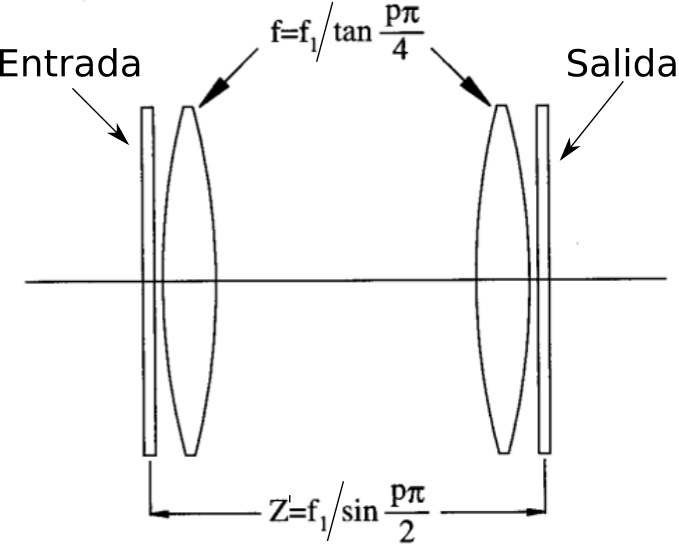


Al realizar la propagación de la entrada a travez del sistema utilizando el formalismo ABCD, se obtiene en el plano de salida:
\begin{equation}
\begin{split}
u_{p}(x_{p})=\exp{\left(\frac{i\pi x_{p}^{2}}{\lambda f_{1}\tan{(\phi)}}\right)}\int_{-\infty}^{\infty}u_{0}(x_{0})\exp{\left(\frac{i\pi x_{0}^{2}}{\lambda f_{1}\tan{(\phi)}}\right)}\\
\times \exp{\left(-\frac{2\pi i x_{0}x_{p}}{\lambda f_{1}\sin{(\phi)}}\right)}dx_{0}
\end{split}
\end{equation}
Con $\phi = \frac{p \pi}{2}$, $p$ siendo el orden de la transformada, y $f_{1}$ es una distancia fíja arbitraria. Cabe destacar que la salida del sistema simplemente es una propagación libre con los parámetros de las lentes y distancias apropiadas para que la anterior expresión sea equivalente a la transformada fraccionaria introducida anteriormente con excepción del factor de fase.

Comparando la expresión de la difracción de Fresnel y el resultado de la propagación en el sistema propuesto por Lohmann (que a su vez está directamente relacionado con la transformada fraccionaria), se pueden ver ciertas similitudes, las únicas diferencias son los factores de escala de las funciones exponenciales; esto no permite expresar la FRT (transformada fraccionaria) como una convolución. Al quitar la lente a la salida del sistema tipo Lohmann, se modifica la salida del sistema únicamente por dicho factor de fase cuadrático (el campo de la FRT no se modifica) y se obtiene:
\begin{equation}
\begin{split}
u_{p}(x_{p})=\int_{-\infty}^{\infty}u_{0}(x_{0})\exp{\left(\frac{i\pi x_{0}^{2}}{\lambda f_{1}\tan{(\phi)}}\right)}
 \exp{\left(-\frac{2\pi i x_{0}x_{p}}{\lambda f_{1}\sin{(\phi)}}\right)}dx_{0}
\end{split}
\end{equation}

Al eliminar dicha lente, se puede considerar el sistema como un sistema formador de imagen (óptica geométrica)); en dichos sistemas se necesita un objeto e información de la lente (radio de sus dioptrios, índices de refracción o su focal equivalente) para determinar en qué posición se formará la imagen del objeto. Un esquema de esto se puede ver de la figura acontinuación:

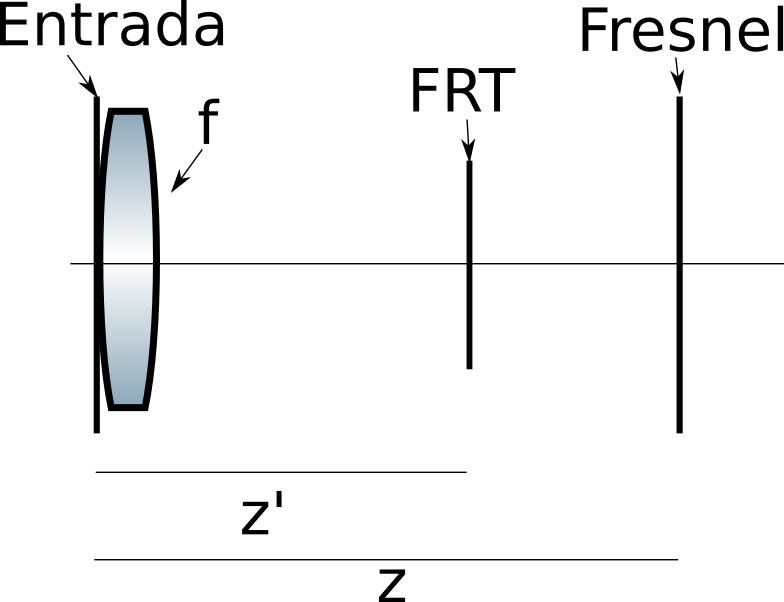

Donde los parámetros del sistema son $f= f_{1}/\tan{(\phi/2)}$ y $z'= f_{1}\sin{\phi}$. Utilizando el resultado de Gauss para la formación de imagenes:
\begin{equation}
\frac{1}{s_{0}}+\frac{1}{s_{i}}=\frac{1}{f}
\end{equation}
Con $s_{i}=z'=f_{1}\sin{\phi}$ , y $s_{0} = -z$(por la posición en el sistema formador de imagen). De los parámetros y de la relacióbn de Gauss se obtiene que la distancia $z$ a la distribución de Fresnel es:
\begin{equation}
z=f_{1}\tan{(\phi)}
\end{equation}
Entonces se puede notar que el patrón de difracción de Fresnel está directamente relacionado con el patrón generado por una $FRT$ en un sistema tipo Lohmann. Naturalmente se obtendrá una magnificación dada por:
\begin{equation}
\beta=\frac{z'}{z}= \cos{(\phi)}
\end{equation}

En resumen, del sistema formador de imagen se define el objeto como el patrón de Fresnel y la imagen el patrón del sistema cuasi Lohmann (cuasi, debido a la eliminación de la segunda lente).
De Goodmanm se tiene que el campo en la posición de la imagen de dicho sistema está dada por la relación:
\begin{equation}
u_{z'}(x_{z'})=u_{z}\left(\frac{x_{z}'}{\beta}\right)\exp{\left[\left(\frac{i\pi x_{z}'^{2}}{\lambda z'}\right)\left(1-\frac{1}{\beta}\right)\right]}
\end{equation}
Ya que interesa es el patrón de difracción de Fresnel, se despeja $u_{z}$ y se sustituye el valor de $z'$, se obtiene:
\begin{equation}
u_{z}\left(\frac{x_{z'}}{\beta}\right)= u_{z'}(x_{z'})\exp{\left(\frac{i\pi (1-\cos{(\phi)})x_{z'}^{2}}{\lambda f_{1}\sin{(\phi)}\cos{(\phi)}}\right)}
\end{equation}

$u_{z'}$ es el patrón que surge de la $FRT$ afectado tras la eliminación de la segunda lente, entonces:
\begin{equation}
\begin{split}
u_{z}\left(\frac{x_{z'}}{\beta}\right)=\exp{\left(\frac{i\pi (1-\cos{(\phi)})x_{z'}^{2}}{\lambda f_{1}\sin{(\phi)}\cos{(\phi)}}\right)}\int_{-\infty}^{\infty}u_{0}(x_{0})\exp{\left(\frac{i\pi x_{0}^{2}}{\lambda f_{1}\tan{(\phi)}}\right)}\\
 \times \exp{\left(-\frac{2\pi i x_{0}x_{p}}{\lambda f_{1}\sin{(\phi)}}\right)}dx_{0}
 \end{split}
\end{equation}

Para dejar la expresión anterior en términos de una transformada fraccionaria del sistema tipo Lohmann, se agrega el conjugado del factor de fase eliminado, y se obtiene en general:
\begin{equation}
u_{z}\left(\frac{x_{z'}}{\beta}\right)= \exp{\left(\frac{i\pi x_{z'}^{2}\tan{(\phi)}}{\lambda f_{1}}\right)}F^{p}[u_{0}(x_{0})]
\end{equation}
Donde $F^{p}$ es la transformada de Fourier de orden fraccionario $p$.

De esta forma se tiene una expresión para obtener la difracción de Fresnel en términos de una transformada de Fourier fraccionaria, acontinuación se estudiará la forma de llevar a cabo los cálculos numéricos de la $FRT$ de forma eficiente. 

DIFRACCIÓN DE FRESNEL NUMÉRICA UTILIZANDO LA FRT

Cómo ya se mencionó en el apartado anterior, el método consiste en hallar la transformación óptica a la salida del sistema de Lohman, y realizar la correción de fase , esto se puede realizar así:

1) Acción de la primera lente: Esto consiste en multiplicar la entrada por un factor de fase dado por:

\begin{equation}
\exp{\left[-j\frac{\pi}{N}\tan{\left(p\frac{\pi}{4}\right)}m^{2}\right]}
\end{equation}

2) Propagación libre del resultado del paso 1, y se logra con:
(a) La FFT de la señal resultante del paso 1
(b) multiplicación por la función de fase cuadrática dada por:

\begin{equation}
\exp{\left[-j\frac{\pi}{N}\sin{\left(p\frac{\pi}{2}\right)}\widetilde{m}^{2}\right]}
\end{equation}
c) Una IFFT de lo obtenido

3) Acción de la segunda lente, esto es, nuevamente multiplicar por el factor:
\begin{equation}
\exp{\left[-j\frac{\pi}{N}\tan{\left(p\frac{\pi}{4}\right)}m^{2}\right]}
\end{equation}

4) Acción de la fase de correción :
\begin{equation}
\exp{\left[j\frac{\pi}{N}\tan{\left(p\frac{\pi}{2}\right)}m^{2}\right]}
\end{equation}

Para que el muestreo sea óptimo, se debe cumplir:
\begin{equation}
\begin{split}
\left|\sin{\left(p\frac{\pi}{2}\right)}\right|<1\\
\left|\tan{\left(p\frac{\pi}{4}\right)}\right|<1
\end{split}
\end{equation}
Esto por las mismas razones de lo explicado en la sección del cálculo numérico utilizando las funciones de propagación respuesta al impulso y función de transferencia.

Para obtener una equivalencia total (en amplitud y fase) con la FRT, es necesario introducir una constante de acople:
\begin{equation}
M_{p}= \exp{\left(-i\pi sgn \left[\sin{(p\frac{\pi}{2})}/4+ip\frac{\pi}{4}+\pi/4\right]\right)}
\end{equation}

En cuanto a a la relación de la distancia de propagación con el orden de la transformada fraccionaria, se tiene de análisis anteriores:

\begin{equation}
LxL_\widetilde{x}=\lambda f/N
\end{equation}
Para el caso del montaje tipo Lohman se cumple que $Lx=L_\widetilde{x}=L_{x'}$, es decir, los soportes del dominio objeto, fracionario y de Fourier son iguales, por lo tanto:
\begin{equation}
f_{1} =Lx^{2} N/\lambda
\end{equation}
y:
\begin{equation}
z = f_{1}\tan{(p\pi/2)}
\end{equation} 
De estas dos relaciones se obtiene el orden equivalente $p$ para una propagación libre a una distancia $z$.

En la clase propagadores se encuentra el propagador de fraccionario para determinar patrones de difracción de Fresnel utilizando la transformada fraccionaria, acontinuación algunas comparaciones entre los propagadores.

In [7]:
#implementación propagador Fraccionario
func = plt.imread('a_difractar.png') # transparencia de entrada
func = func[:,:,0] # selección del canal
N= 768  # número de pixeles
dy = 19e-6 # tamaño del pixel del modulador
Ly = dy*N # soporte de los planos utilizados
z = 0.1 # distancia de propagación [metros] (régimen propagador función de transferencia)
p = np.arctan(z*l_onda*N/Ly**2)*2/np.pi # calculo del orden equivalente de la transformada fraccionaria
print('Orden equivalente = ',p, ', Para z = ',z)

Orden equivalente =  0.14290069030938668 , Para z =  0.1


Comparación entre propagador Fraccionario y Propagador función de Transferencia ($z<z_{critico}$ campo cercano)

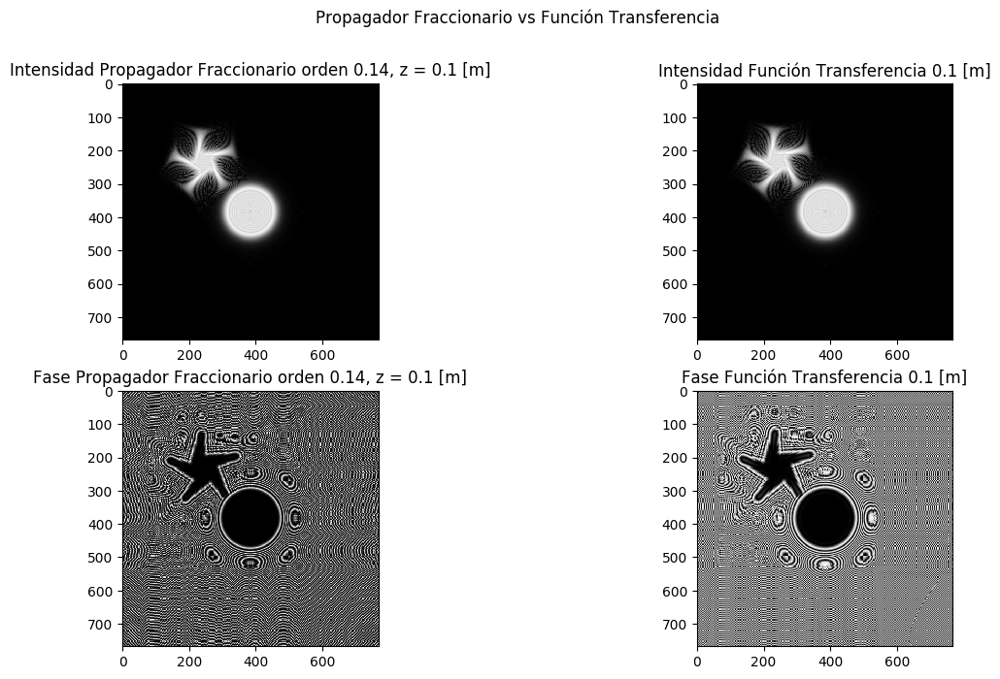

In [8]:
plt.figure(num = 1, figsize = (14,7.68), dpi = 100)
plt.suptitle('Propagador Fraccionario vs Función Transferencia ')
plt.subplot(2,2,1)
plt.title('Intensidad Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
fraccionario = propagador_seleccion.propagadorFraccionario(func,p)
plt.imshow(np.log((abs(fraccionario)**2)+.01), cmap = 'gist_gray')
plt.subplot(2,2,2)
plt.title('Intensidad Función Transferencia %.1f [m]'%z)
f_transferencia = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z)
plt.imshow(np.log((abs(f_transferencia)**2)+.01),cmap = 'gist_gray')
plt.subplot(2,2,3)
plt.title('Fase Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
plt.imshow(np.log((np.angle(fraccionario)**2)+100), cmap = 'gist_gray')
plt.subplot(2,2,4)
plt.title('Fase Función Transferencia %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z)
plt.imshow(np.log((np.angle(f_transferencia)**2)+1),cmap = 'gist_gray')
plt.show()

Realizando ahora la misma comparación entre el propagador fraccionario y el propagador función de transferencia pero en las regiones particulares, $z> z_{crítico}$ y $z\approx 0$:

/home/roberto/Documentos/computacional/tercer_corte/proyecto/fast_fractional/1ro_agosto/propagadores.py:18: RuntimeWarning: divide by zero encountered in cdouble_scalars
  fase = np.exp(1j*2*np.pi*z/l_onda)/(1j*l_onda*z) # se normaliza el factor de fase
/home/roberto/Documentos/computacional/tercer_corte/proyecto/fast_fractional/1ro_agosto/propagadores.py:18: RuntimeWarning: invalid value encountered in cdouble_scalars
  fase = np.exp(1j*2*np.pi*z/l_onda)/(1j*l_onda*z) # se normaliza el factor de fase
/home/roberto/.local/lib/python3.6/site-packages/matplotlib/image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
/home/roberto/.local/lib/python3.6/site-packages/matplotlib/image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
/home/roberto/.local/lib/python3.6/site-packages/matplotlib/image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/

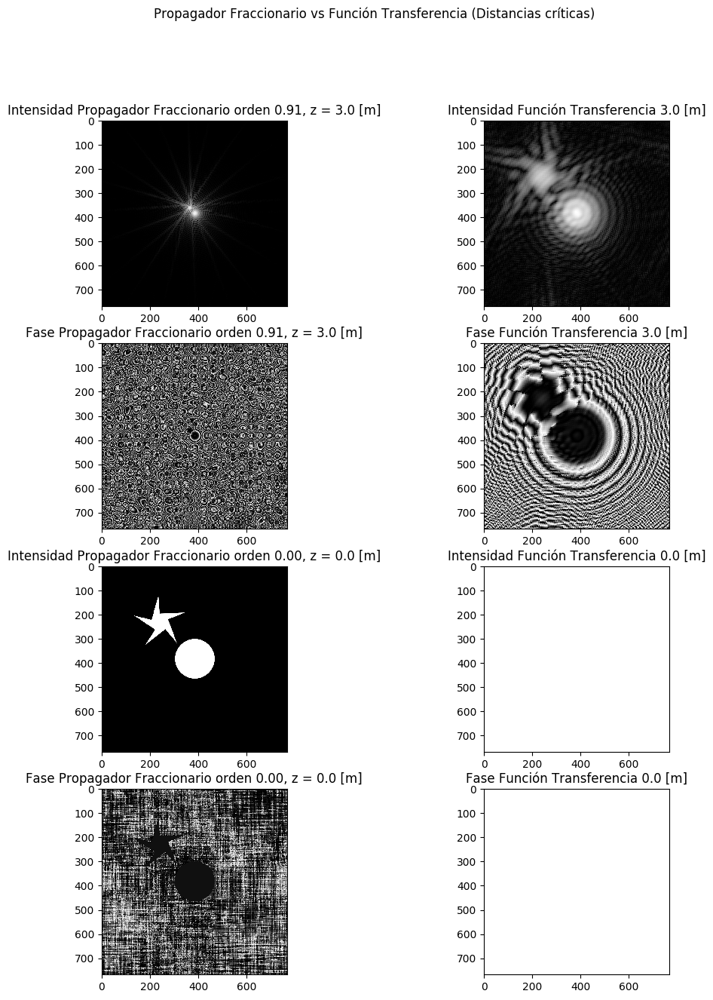

In [9]:
z = 3 # distancia de propagación [metros] 
p = np.arctan(z*l_onda*N/Ly**2)*2/np.pi # calculo del orden equivalente de la transformada fraccionaria
plt.figure(num = 1, figsize = (12,15), dpi = 100)
plt.suptitle('Propagador Fraccionario vs Función Transferencia (Distancias críticas)')
plt.subplot(4,2,1)
plt.title('Intensidad Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
fraccionario = propagador_seleccion.propagadorFraccionario(func,p)
plt.imshow(np.log((abs(fraccionario)**2)+.01), cmap = 'gist_gray')
plt.subplot(4,2,2)
plt.title('Intensidad Función Transferencia %.1f [m]'%z)
f_transferencia = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z)
plt.imshow(np.log((abs(f_transferencia)**2)+.01),cmap = 'gist_gray')
plt.subplot(4,2,3)
plt.title('Fase Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
plt.imshow(np.log((np.angle(fraccionario)**2)+100), cmap = 'gist_gray')
plt.subplot(4,2,4)
plt.title('Fase Función Transferencia %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z)
plt.imshow(np.log((np.angle(f_transferencia)**2)+1),cmap = 'gist_gray')
z = 0.0 # distancia de propagación [metros] 
p = np.arctan(z*l_onda*N/Ly**2)*2/np.pi # calculo del orden equivalente de la transformada fraccionaria
plt.figure(num = 1, figsize = (14,7.68), dpi = 100)
plt.suptitle('Propagador Fraccionario vs Función Transferencia (Distancias críticas)')
plt.subplot(4,2,5)
plt.title('Intensidad Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
fraccionario = propagador_seleccion.propagadorFraccionario(func,p)
plt.imshow(np.log((abs(fraccionario)**2)+.01), cmap = 'gist_gray')
plt.subplot(4,2,6)
plt.title('Intensidad Función Transferencia %.1f [m]'%z)
f_transferencia = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z)
plt.imshow(np.log((abs(f_transferencia)**2)+.01),cmap = 'gist_gray')
plt.subplot(4,2,7)
plt.title('Fase Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
plt.imshow(np.log((np.angle(fraccionario)**2)+100), cmap = 'gist_gray')
plt.subplot(4,2,8)
plt.title('Fase Función Transferencia %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorFuncionTransferencia(func,l_onda,z)
plt.imshow(np.log((np.angle(f_transferencia)**2)+1),cmap = 'gist_gray')
plt.show()

Como se esperaba, fuera de su régimen de funcionamiento, el propagador función de transferencia no brinda resultados relevantes en comparación con la $FRT$ que sigue brindando resultados optimos. Ahora bien, a una distancia $z = 0[m]$, se debería observar la transparencia misma, cosa que no ocurrirá con la función de transferencia debído al factor $1/\lambda z$ (aparte de la violación a la aproximación de Fresnel en la teoría escalar de la difracción); con la $FRT$ si se obtiene el objeto para una $z =0$, esto debido a que el desarrollo analítico para llegar a la difracción de Fresnel por medio de la transformada fraccionaria fué hecho a partir de utilizar el formalismo ABCD para sistémas oṕticos en la obtención de la expresión analítica del montaje para obtener la $FRT$ óptica, en dicho formalismo no se hacen suposiciónes de en qué régimen se está trabajando(Rayleigh, Fresnel o Fraunhofer), si no que solo se aplica una operación matricial sobre el haz de entrada según el elemento óptico que lo afecte en su recorrido por el sistema. Por lo tanto bajo la representación de la difracción en términos de una transformada Fraccionaria, se podrán utilizar distancias desde el objeto mismo (Rayleigh) hasta el "infinito" (Fraunhofer). 

Se procede a realizar la misma comparación anterior, pero entre los propagadores Fraccionario y respuesta al impulso, primero dentro de su régimen operativo $z>z_{crítico}$:

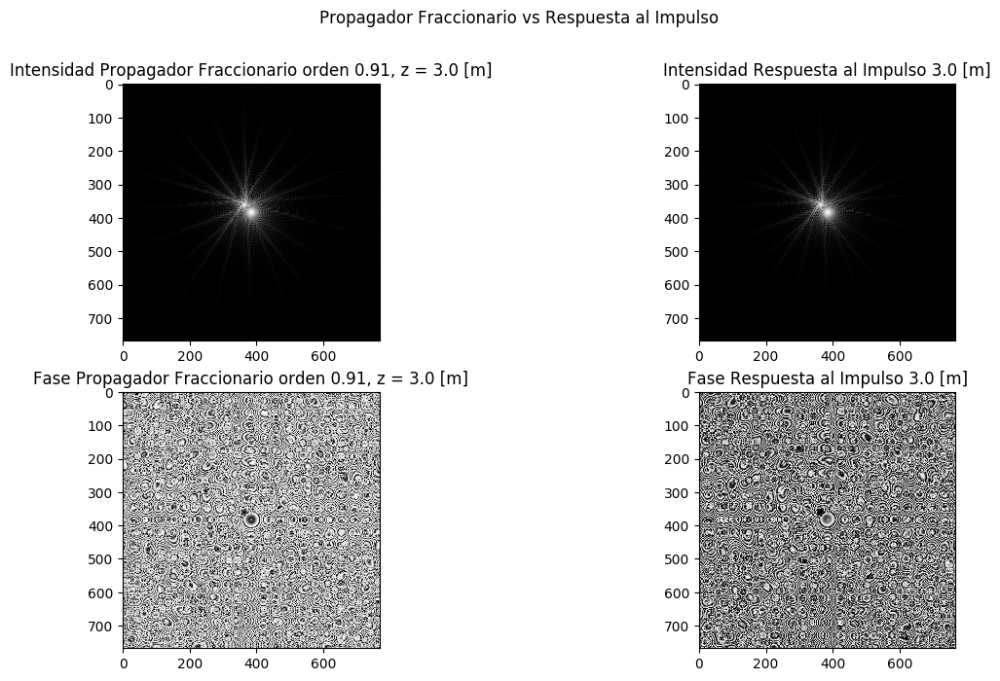

In [10]:
z =3 # distancia de propagación [metros]
p = np.arctan(z*l_onda*N/Ly**2)*2/np.pi # calculo del orden equivalente de la transformada fraccionaria
plt.figure(num = 1, figsize = (14,7.68), dpi = 100)
plt.suptitle('Propagador Fraccionario vs Respuesta al Impulso ')
plt.subplot(2,2,1)
plt.title('Intensidad Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
fraccionario = propagador_seleccion.propagadorFraccionario(func,p)
plt.imshow(np.log((abs(fraccionario)**2)+.01), cmap = 'gist_gray')
plt.subplot(2,2,2)
plt.title('Intensidad Respuesta al Impulso %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)
plt.imshow(np.log((abs(r_impulso)**2)+10000),cmap = 'gist_gray')
plt.subplot(2,2,3)
plt.title('Fase Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
plt.imshow(np.log((np.angle(fraccionario)**2)+.1), cmap = 'gist_gray')
plt.subplot(2,2,4)
plt.title('Fase Respuesta al Impulso %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)
plt.imshow(np.log((np.angle(r_impulso)**2)+1),cmap = 'gist_gray')
plt.show()

Para $z<z_{crítico}$ y para $z\approx \infty$

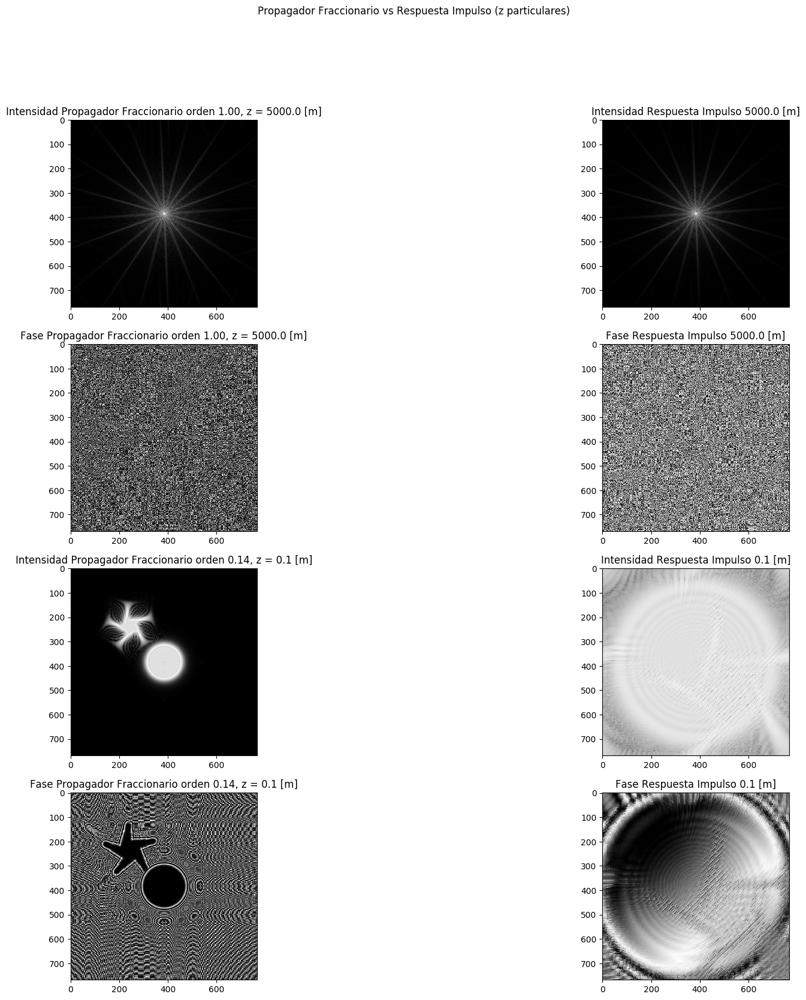

In [11]:
z = 5000 # distancia de propagación [metros] campo lejano
p = np.arctan(z*l_onda*N/Ly**2)*2/np.pi # calculo del orden equivalente de la transformada fraccionaria
plt.figure(num = 1, figsize = (21,19), dpi = 100)
plt.suptitle('Propagador Fraccionario vs Respuesta Impulso (z particulares)')
plt.subplot(4,2,1)
plt.title('Intensidad Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
fraccionario = propagador_seleccion.propagadorFraccionario(func,p)
plt.imshow(np.log((abs(fraccionario)**2)+.001), cmap = 'gist_gray')
plt.subplot(4,2,2)
plt.title('Intensidad Respuesta Impulso %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)
plt.imshow(np.log((abs(r_impulso)**2)+1000),cmap = 'gist_gray')
plt.subplot(4,2,3)
plt.title('Fase Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
plt.imshow(np.log((np.angle(fraccionario)**2)+100), cmap = 'gist_gray')
plt.subplot(4,2,4)
plt.title('Fase Respuesta Impulso %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)
plt.imshow(np.log((np.angle(r_impulso)**2)+1),cmap = 'gist_gray')
z = 0.1 # distancia de propagación [metros] 
p = np.arctan(z*l_onda*N/Ly**2)*2/np.pi # calculo del orden equivalente de la transformada fraccionaria
plt.subplot(4,2,5)
plt.title('Intensidad Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
fraccionario = propagador_seleccion.propagadorFraccionario(func,p)
plt.imshow(np.log((abs(fraccionario)**2)+.01), cmap = 'gist_gray')
plt.subplot(4,2,6)
plt.title('Intensidad Respuesta Impulso %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)
plt.imshow(np.log((abs(r_impulso)**2)+.01),cmap = 'gist_gray')
plt.subplot(4,2,7)
plt.title('Fase Propagador Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
plt.imshow(np.log((np.angle(fraccionario)**2)+100), cmap = 'gist_gray')
plt.subplot(4,2,8)
plt.title('Fase Respuesta Impulso %.1f [m]'%z)
r_impulso = propagador_seleccion.propagadorRespuestaImpulso(func,l_onda,z)
plt.imshow(np.log((np.angle(r_impulso)**2)+1),cmap = 'gist_gray')
plt.show()

Se evidencia, que el propagador fraccionario abarca todo el rango de difracción, desde $Rayleigh$ hasta $Fraunhofer$. Bajo estos resultados, se utilizó el propagador fraccionario para generar hologramas (CGH) y reconstruirlos ópticamente en el laboratorio de Óptica Moderna de la Universidad de Pamplona por medio del uso de un modulador espacial de luz(SLM).

$HOLOGRAFÍA$

La fotografía convencional solo registra información de la amplitud de un objeto por medio de la intensidad de las ondas que estos reflejan, esto debido a que los dispositivos de captura actuales no pueden operar en el rango de frecuancias ópticas (cerca de los petahertz). Gabor, se idea un método para registrar tanto la fase como la amplitud de una onda en una sola captura, dicha captura se realiza por medio de interferograma, a dicho método se le conoce como holografía y al producto, holograma. Existen varios tipos de hologramas, en este trabajo solo se mostrará el holograma de Gabor u holograma sobre el eje; el montaje experimental para obtener un holograma sobre el eje se aprecia en la figura acontinuación:

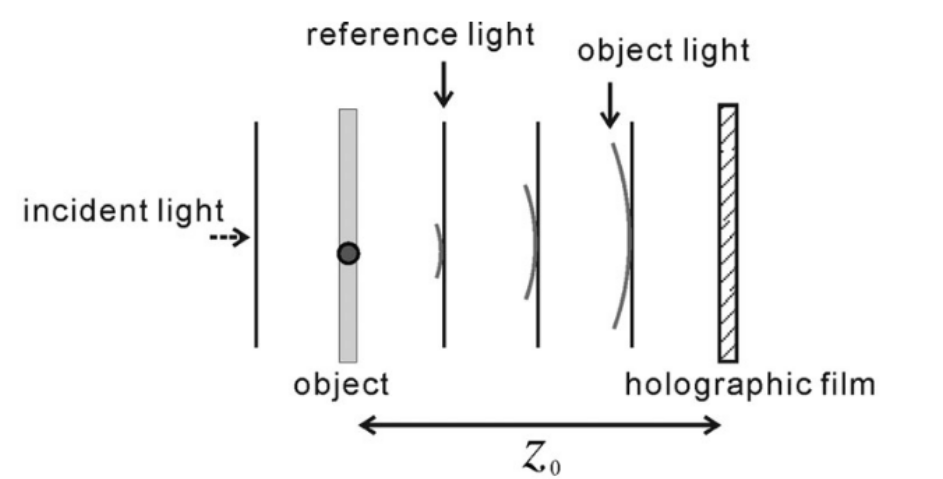

El proceso consiste en una onda plana incidiendo sobre una transparencia a la cual se le denomina objeto (igual que para la difracción), dicho objeto posee la característica de que difracta la luz en un porcentaje relativamente bajo, permitiendo que la onda incidente (onda referencia) llegue a la placa holográfica (o cámara ccd en hologafía digital) sin perturbación alguna e interfiera con la onda difractada por el objeto. El patrón de interferencia entre la onda difractada y la onda referencia tiene información de la amplitud y fase del objeto (por la interferencia), y ya que la placa holográfica solo puede almacenar información por medio de la intensidad, se tiene que matemáticamente la intensidad sobre la placa holográfica es:
\begin{equation}
t = |\psi_{R}+\psi_{O}|^{2}
\end{equation}
Donde $\psi_{R}$ es la onda de referencia y $\psi_{O}$ la onda difractada por el objeto, que por efectos de simplicidad de llamará onda objeto.
Desarrollando  la expresión anterior se obtiene:
\begin{equation}
t = |\psi_{R}|^{2}+|\psi_{O}|^{2}+\psi_{R}^{*}\psi_{O}+\psi_{R}\psi_{O}^{*}
\end{equation}
Donde * representa la operación complejo conjugado.
Se tienen 4 términos, dos de ellos son valores constantes, mientras que los otros dos representan, uno la onda difractada por el objeto ($\psi_{R}^{*}\psi_{O}$)  y el restante, la onda difracatada por el objeto pero conjugada ($\psi_{R}\psi_{O}^{*}$).
Asumiento la placa holográfica como un medio de registro ideal, al iluminar dicho interferograma con la misma onda de refencia se obtiene:
\begin{equation}
\psi_{R}t = \psi_{R}|\psi_{R}|^{2}+\psi_{R}|\psi_{O}|^{2}+\psi_{R}\psi_{R}^{*}\psi_{O}+\psi_{R}\psi_{R}\psi_{O}^{*}
\end{equation}
Los dos primeros términos siguen siendo constantes, físicamente representan una iluminación uniforme de fondo, los dós últimos términos son la onda difractada del objeto y su conjugado respectivamente, haciendo un análisis fenomenológico, estas ondas son ondas parabólicas convergentes y divergentes con centro en $z_{0}$ y $-z_{0}$ por lo que una de las dos imágenes será exactamente la del objeto (la de la onda convergente) y la otra será una imagen del objeto difractado a una distancia $2z_{0}$, esto significa que en la distribución de intensidad observada a $-z_{0}$ se observará tanto el objeto como el objeto mismo difractado dicha distancia.  En la figura acontinuación se evidencia lo dicho:
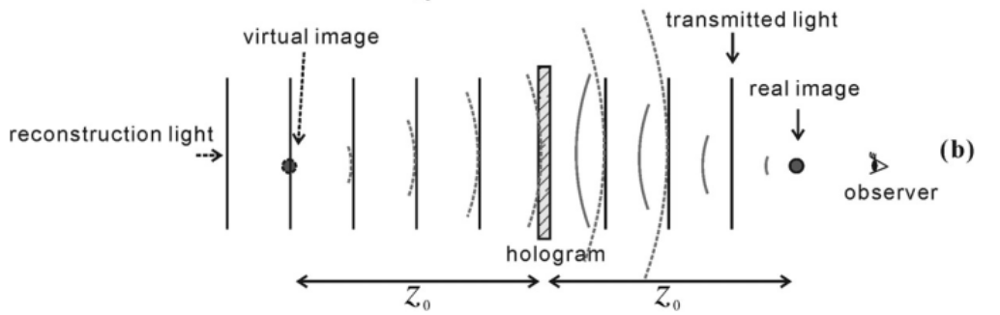

Entonces, el observador ve la imagen "enfocada" del objeto virtual, y ve la imagen difractada del objeto real, ambas sobre el mismo eje óptico.

IMPLEMENTACIÓN HOLOGRAMAS DE GABOR

El objeto será el siguiente:


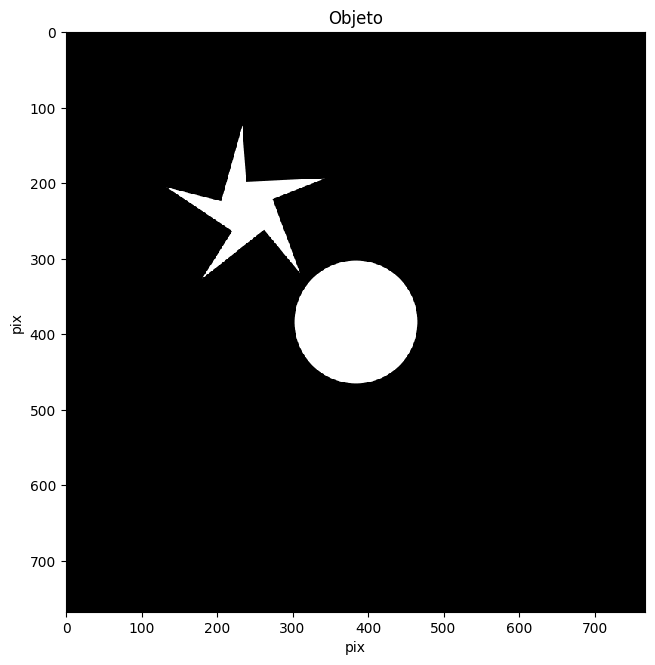

In [12]:
objeto = plt.imread('a_difractar.png') # transparencia de entrada
objeto = objeto[:,:,0] # selección del canal
plt.figure(num = 1, figsize = (14,7.68), dpi = 100)
plt.imshow(objeto, cmap = 'gist_gray')
plt.title('Objeto')
plt.xlabel('pix')
plt.ylabel('pix')
plt.show()

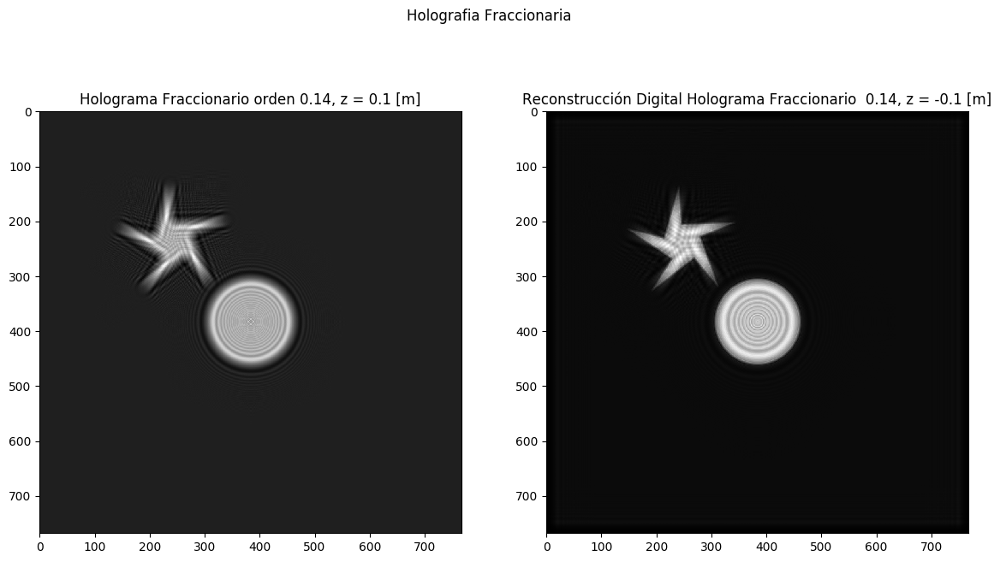

In [13]:
z = 0.1 # distancia de registro del holograma [metros] 
p = np.arctan(z*l_onda*N/Ly**2)*2/np.pi # calculo del orden equivalente de la transformada fraccionaria
fraccionario = propagador_seleccion.propagadorFraccionario(func,p)
ref = np.ones([N,N],dtype = float)
holograma_fraccionario = abs(ref+fraccionario)**2
holograma_fraccionario = holograma_fraccionario/np.amax(holograma_fraccionario)
reconstruccion_fraccionaria = abs(propagador_seleccion.propagadorFraccionario(holograma_fraccionario*ref,p))**2
plt.figure(num = 1, figsize = (14,7.68), dpi = 100)
plt.suptitle('Holografia Fraccionaria')
plt.subplot(1,2,1)
plt.title('Holograma Fraccionario orden %.2f, z = %.1f [m]'%(p,z))
plt.imshow(holograma_fraccionario, cmap = 'gist_gray')
plt.subplot(1,2,2)
plt.title('Reconstrucción Digital Holograma Fraccionario  %.2f, z = -%.1f [m]'%(p,z))
plt.imshow(reconstruccion_fraccionaria, cmap = 'gist_gray')
plt.show()

Debido a que el proceso de registro del holograma en placas holográficas es bastante complejo en cuestiones técnicas, se empiezan a implementar los hologramas generados por computador y reconstruidos ópticamente,  para ello, se utilizan los moduladores espaciales de luz, los cuales son arreglos bidimensionales de pixeles con capacidad de modificar la amplitud o la fase del frente de onda incidente según se necesite. Para este proyecto esto se implementó utilizando un modulador espacial de luz SLM 2500 dispuesto en el montaje de la figura acontinuación:
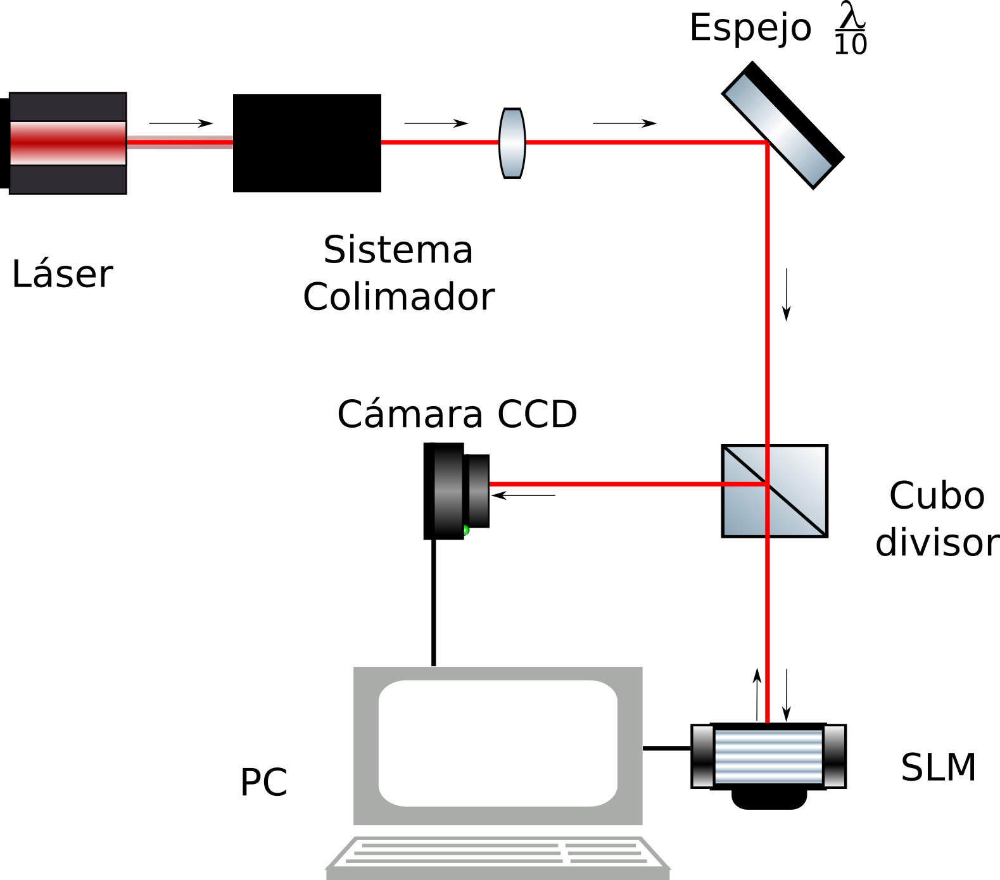

El montaje óptico funciona de la siguiente manera:
1) el sistema colimador genera un frente de onda plano, 
2) el haz llega al modulador espacial de luz, el cual posee un holograma fraccionario generado por computador calculado a una distancia z, este difracta el frente de onda incidente y regresa por el cubo divisor, 
3) El holograma difractado sobre el SLM se propaga una distancia z, justo allí se posiciona la cámara y se captura la distribución de intensidad.

Debido a que el SLM está en una terminal aislada programada para funcionar en el entorno Matlab, se hace la migración de los códigos de los propagadores a dicho entorno. El modulador tiene dimensiones de $1024x768$ [pixeles], por lo que los hologramas fraccionarios cuadrados de $768x768$[pixeles] que se pueden generar con el propagador fraccionario, se posicionan sobre la pantalla del modulador así:
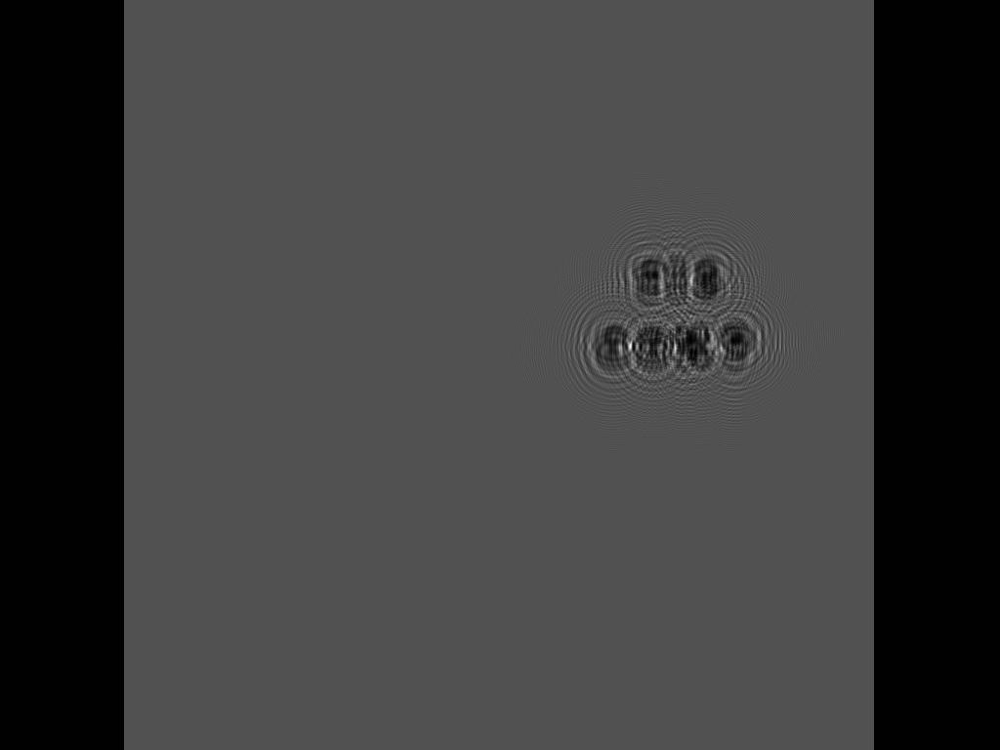

Las franjas oscuras a los costados son el espacio restande de los 256 pixeles extras, esto generará difracción debido al cambio de frecuencia entre el holograma y los pixeles "muertos", sin embargo, a distancias idoneas(pequeñas), el efecto de estos bordes es irrelevante según la posición del holograma. Al difractar el holograma, se obtuvo lo siguiente:

Reconstrucción Óptica:
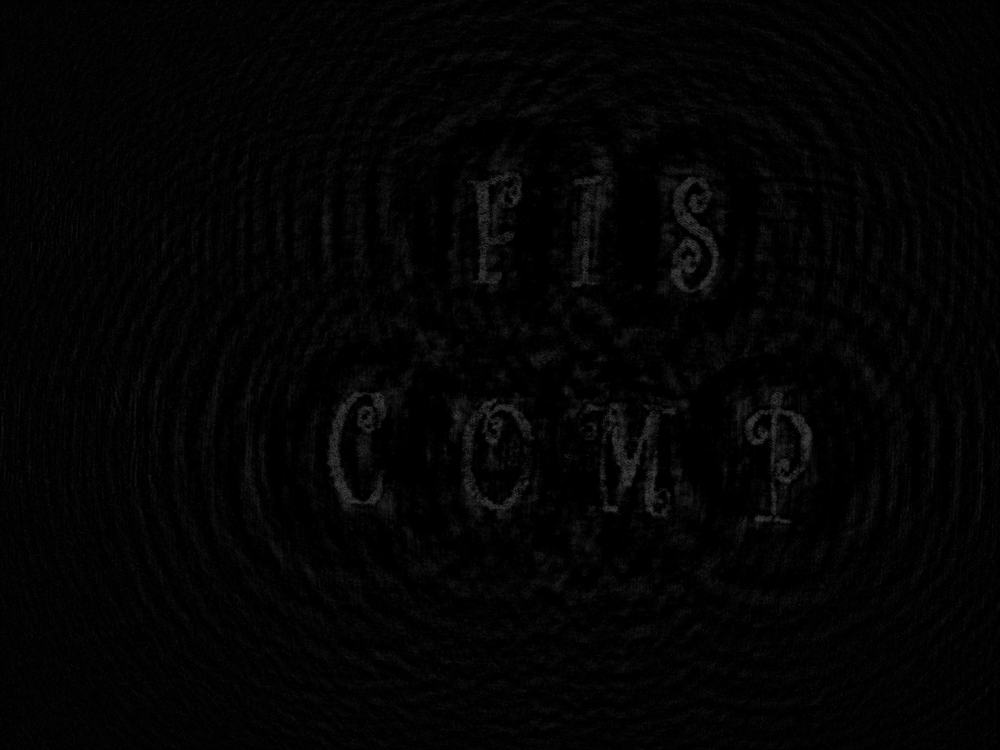

Computacionalmente se obtuvo la siguiente reconstrucción:
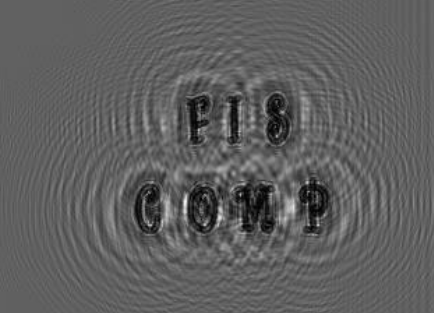

Se realiza el mismo procedimiento, para el mismo orden ($\alpha = 0.1568$ , $z=0.11m$) y diferentes objetos, obtienendo los siguientes resultados:

$Objeto:$ $CÍRCULO$

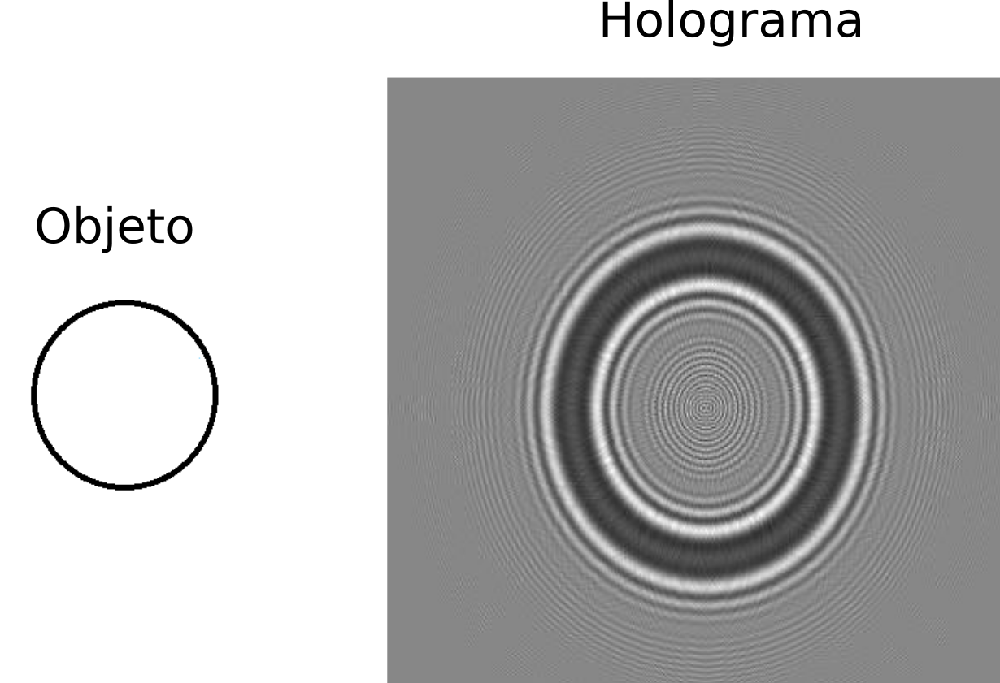

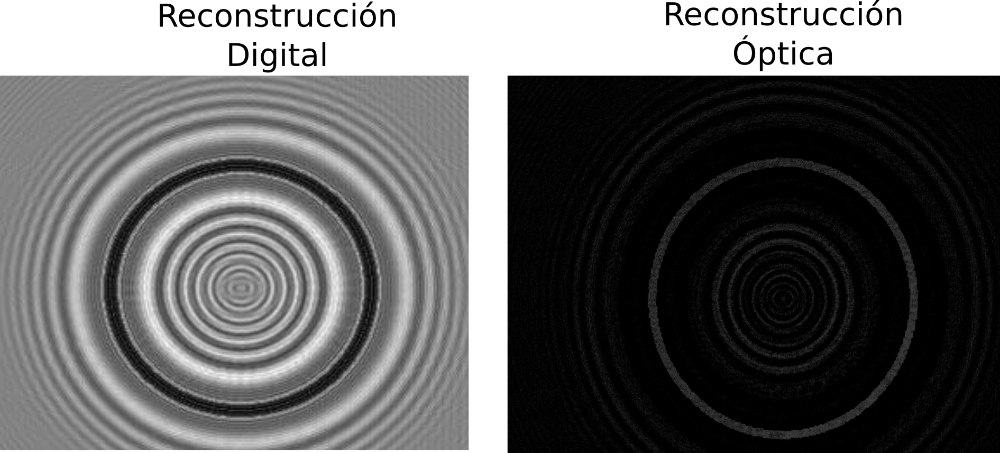

$Objeto:$ $Letra$ $L$

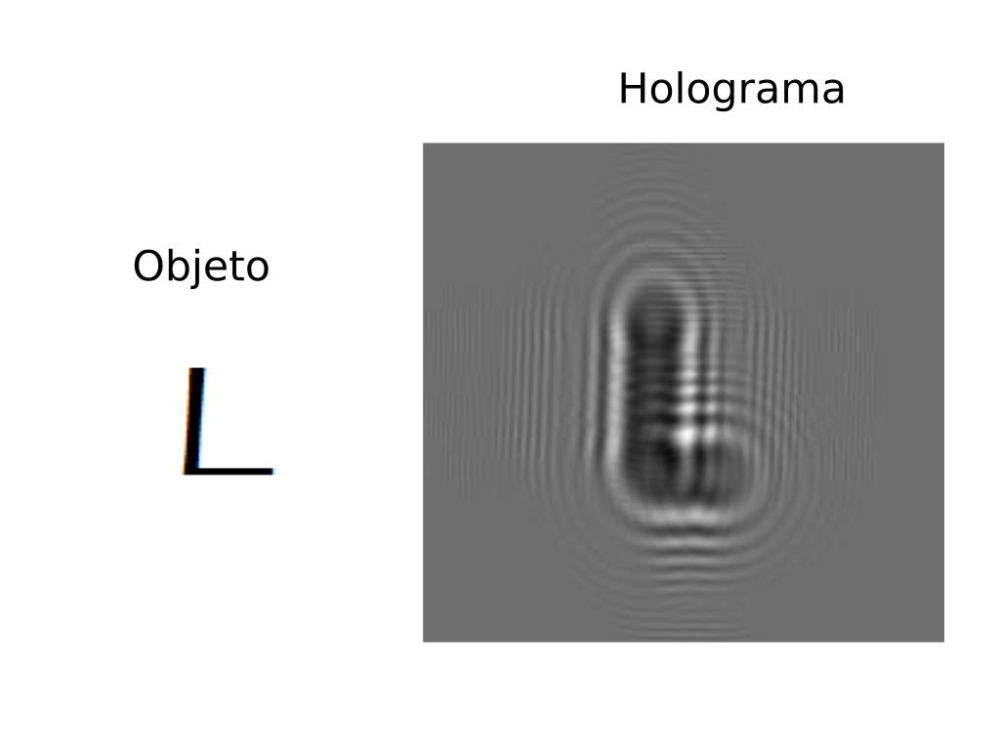

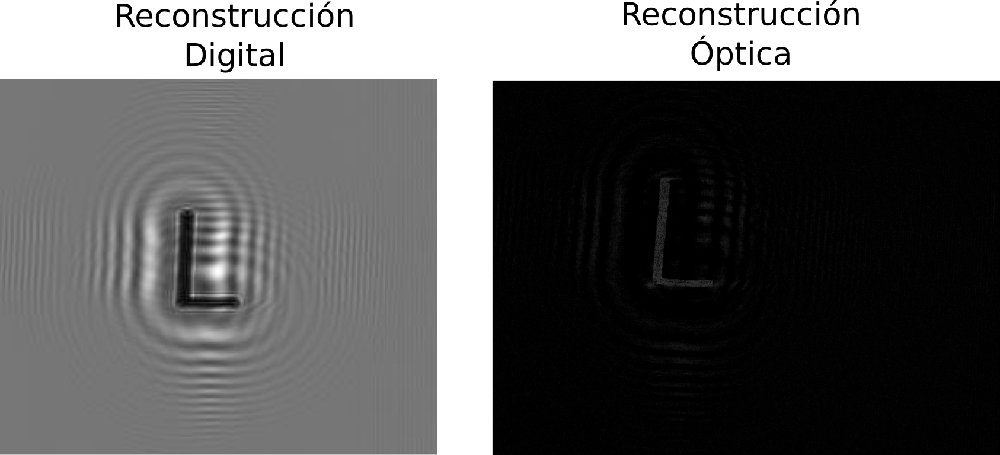

$Objeto:$ $Corazón$

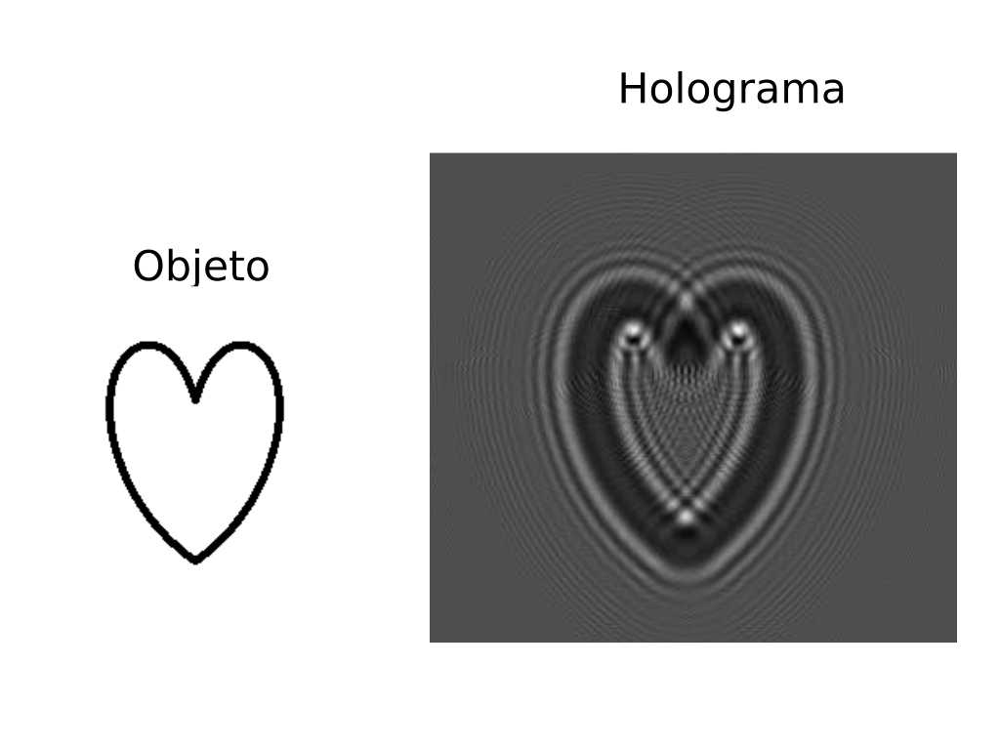

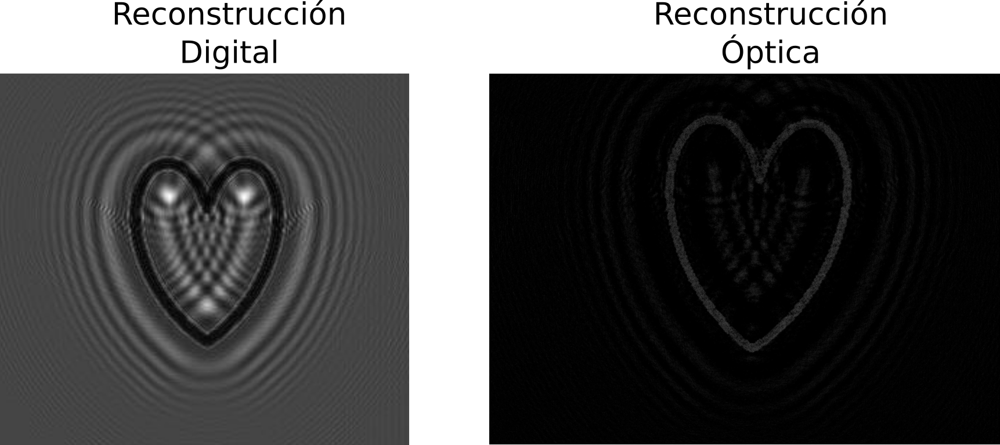

Concluyendo, se realizó la representación analítica de la difracción de Fresnel por medio de una transformada de Fourier fraccionaria. Se implementó tanto computacional como experimentalmente el modelo de la difracción de Fresnel bajo el formalismo de la transformada de Fourier fraccionaria.  Se encontraron los regímenes espaciales para las funciones de propagación clásicas y se evidenció que la función de propagación fraccionaria abarca todos los régimes de la teoría de la difracción escalar (Rayliegh, Fresnel y Fraunhofer). Los algoritmos y la teoría aquí descrita brevemente, se encuentran en detalle en los siguientes artículos y libros:

[1]J.Garcia, C. Ferreira, L.Bernardo, D.Mas,F.Marinho, "Fast Algorthms for free-space diffraction patterns calculation," Opt.Commun.164,233-243,1999

[2]J.Garcia, C. Ferreira,D.Mas,"Fresnel diffraction calculation through the fast fractional Fourier transform," Spie.3490, 1998

[3]J.Garcia, C. Ferreira, L.Bernardo, D.Mas,"From Fresnel patterns to fractional Fourier transform through geometrical optics,"Opt.Eng.39(6)1427-1430, 2000

[4]J.García, D.Mas, R.Dorsch,"Fractional Fourier transform calculation through the fast Fourier transform algorithm", Applied Optics.35, 7013-4018, 1996

[5]J.W.Goodman,Introductión to Fourier Optics, Mc.Graw-Hill Pub.New York,1998

[6]Q.W.Lohmann, "Image rotation, Wigner rotation, and the fractional Fourier transform" J.Opt.Soc.Amer.A10,pp.2181-2186,1993

[7]D.Mendlovic, H.M. Ozaktas, "Fractional FOurier transforms and their optical implementation: I"J.Opt.Soc.Am.A 10(9),1875-1880,1993


[8]D.Mendlovic, H.M. Ozaktas, "Fractional FOurier transforms and their optical implementation: II"J.Opt.Soc.Am.A 10(12),2522-2531,1993

[9]A.W.Lohmann, D.Mendlovic, and Z.Zalevsky,"Fractional transform in optics",Chap. IV in progress in Optics XXXVIII, E.Wolf, Ed., pp. 263-343, Elsevier Science B.V, 1998

[9]L.Bernardo,"ABCD matrix formalism of fractional Fourier transform", Opt.Eng 35(3),732-740,1996

[9]V.Namias, "The fractional Fourier transform and its application in quantum mechanics",J.Inst.Math.Appl.25,241-265,1980

[10]D.G.Voelz, M.C. Roggemann,"Digital simulation of scalar optical diffraction: Revisiting chirp function sampling criteria and consequences,"Appl.OPt.,48,6132-6142,2009

[11]D.G.Voelz,"Computational Fourier Optics", Spie Press,2011

[12]T.C.Poon,J.P.Liu,"Introduction to Modern Digital Holography with Matlab", Cambridge University Press,2014
